Bounding box of calculated footprint for reference image:
	(7.991379004455191, 54.52612444878368, 13.062654135462305, 57.77355672575578)
Bounding box of calculated footprint for image to be shifted:
	(6.472074670366905, 53.46911394465188, 12.116009937433034, 58.36385426476233)
resolutions:  0.00012338268529529252 8.983152841195215e-05
48.49 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 9.2/56.1
Original matching windows:


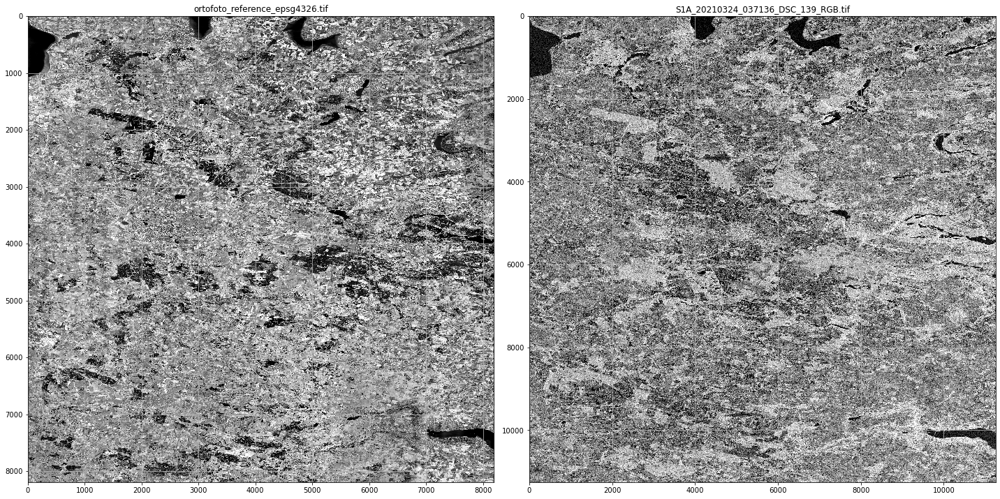

Matching windows with equalized spatial resolution:


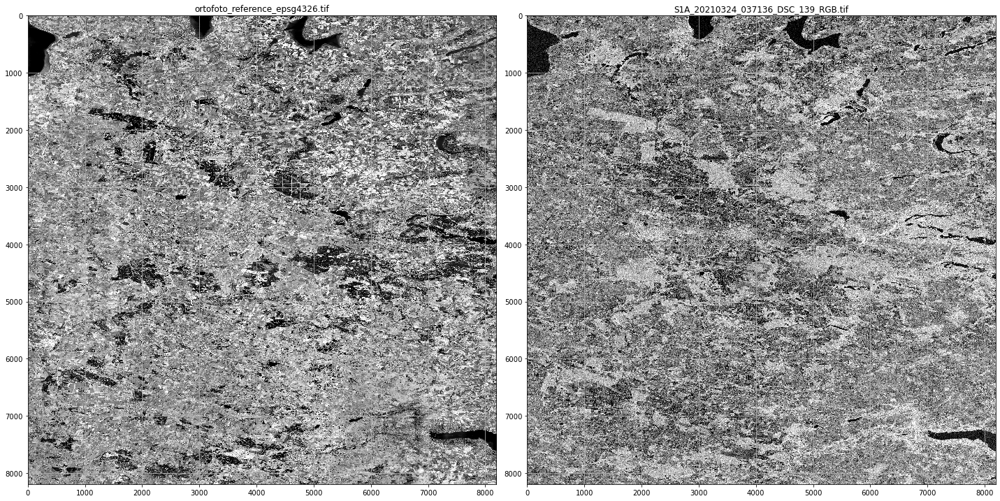

xgsd_factor 1.3734897699778685
ygsd_factor 1.3734897699778685
imfft_xgsd_mapvalues 0.00012338268529529252
imfft_ygsd_mapvalues 0.00012338268529529252
final window size: 8192/8192 (X/Y)


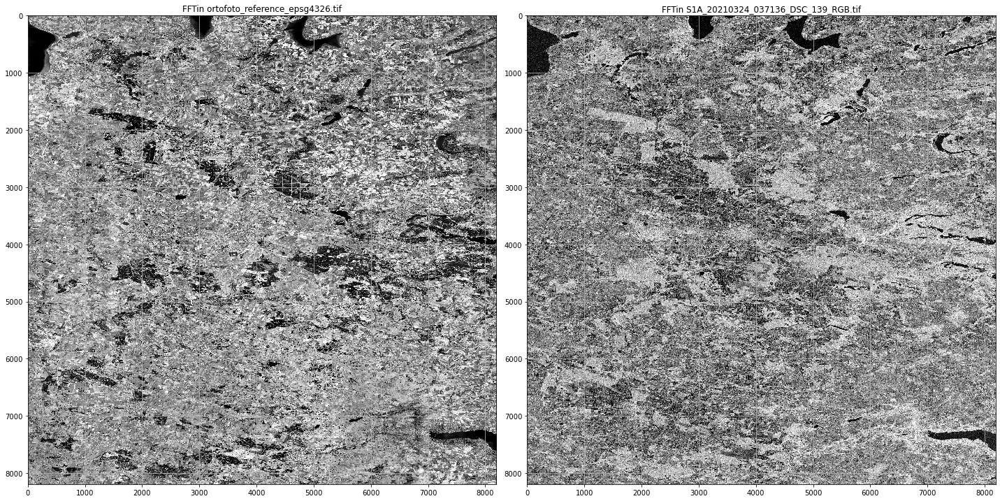

forward FFTW: 22.00s
backward FFTW: 2.52s


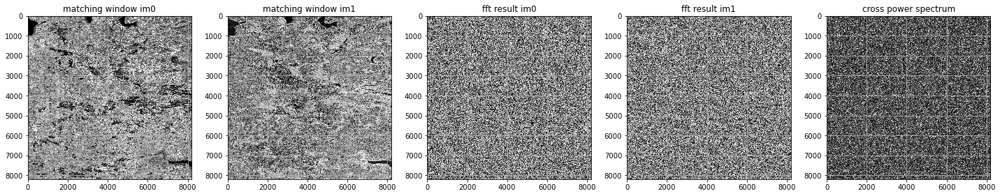

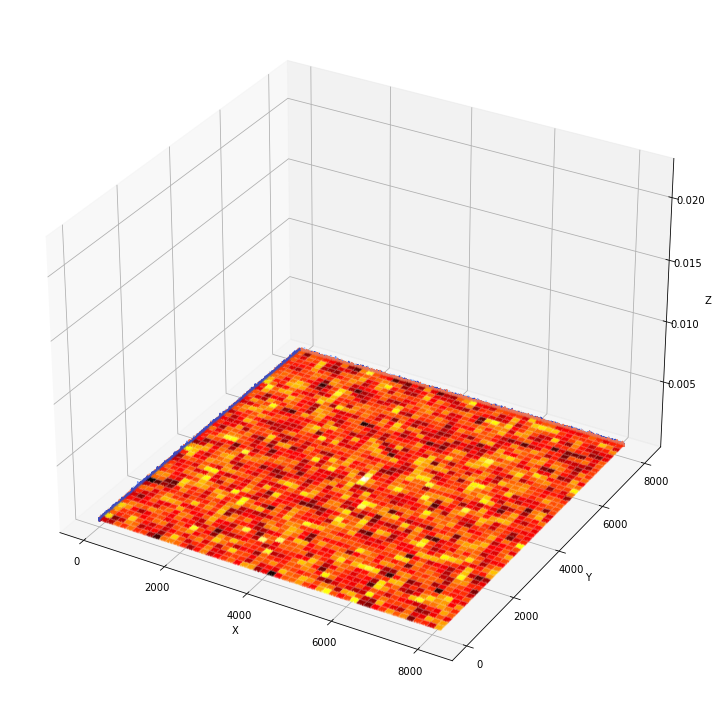

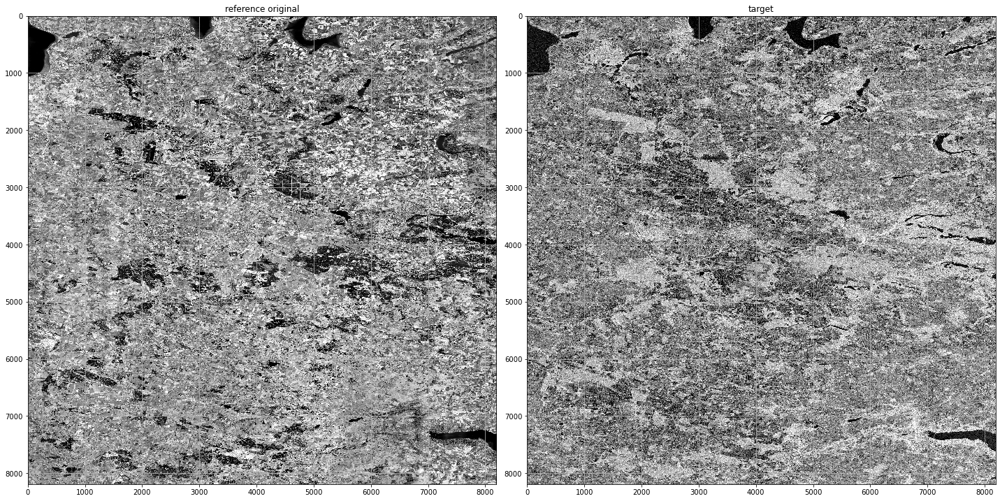

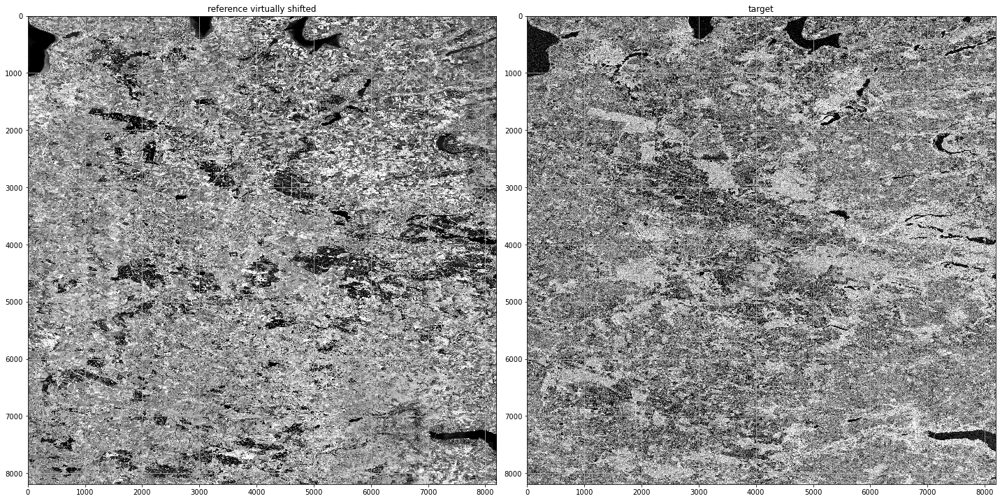

final window size: 4096/4096 (X/Y)


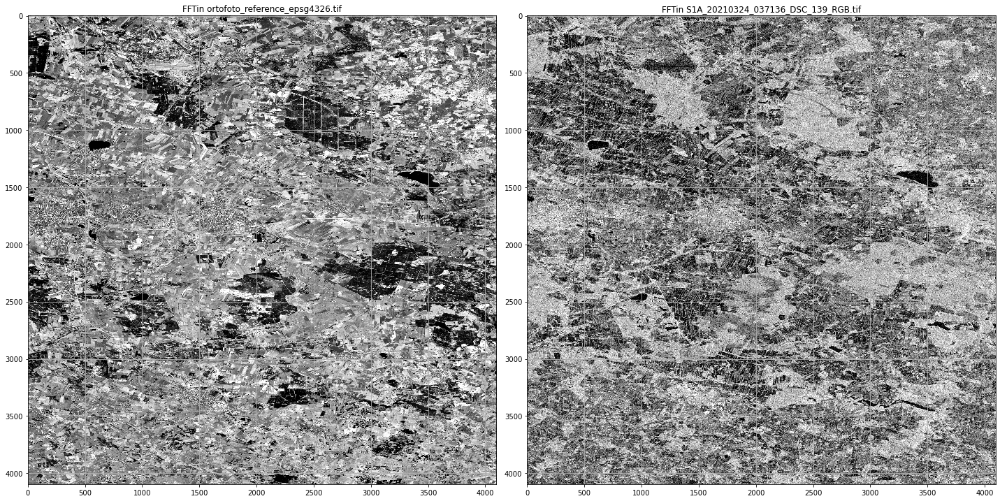

forward FFTW: 12.53s
backward FFTW: 1.10s


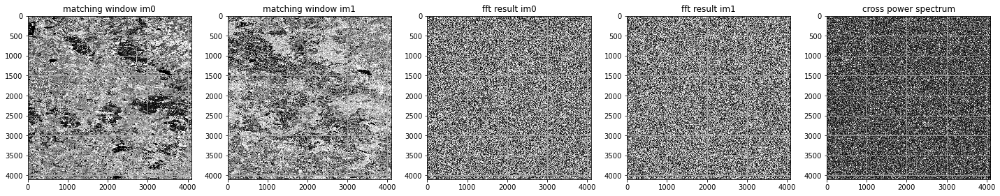

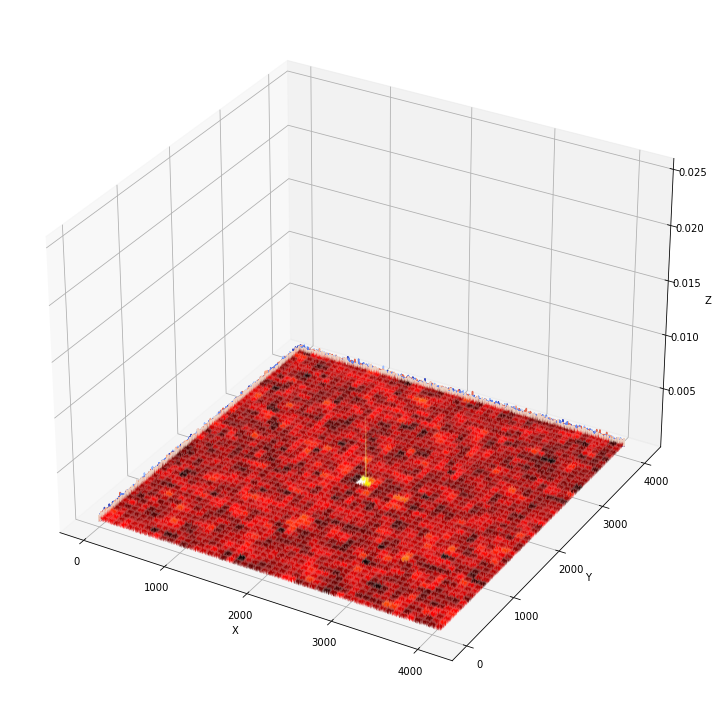

Horizontal side maximum found left. value: 0.0253806258563467
Vertical side maximum found below. value: 0.023929624590285185


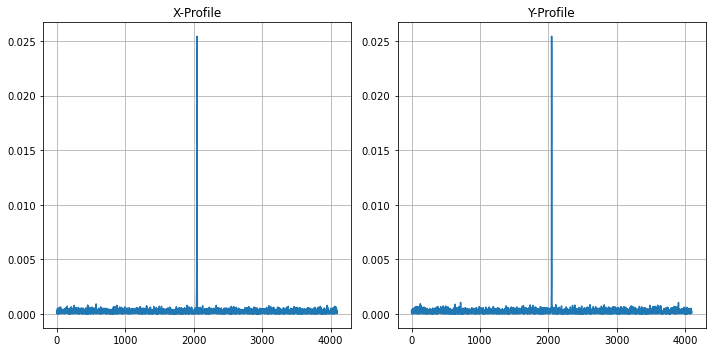

Detected integer shifts (X/Y):                            -1/-1
Detected subpixel shifts (X/Y):                           -0.49949953186577356/0.4847870018803674
Calculated total shifts in fft pixel units (X/Y):         -1.4994995318657736/-0.5152129981196326
Calculated total shifts in reference pixel units (X/Y):   -1.4994995318657736/-0.5152129981196326
Calculated total shifts in target pixel units (X/Y):      -2.059547267104243/-0.7076397822769422
Calculated map shifts (X,Y):				  -0.0001850122788402686/6.35683632097539e-05
Calculated absolute shift vector length in map units:     0.00019562842360668477
Calculated angle of shift vector in degrees from North:   108.9622072813514
Original map info: ['Geographic Lat/Lon', 1.0, 1.0, 6.472074670366905, 58.36385426476233, 8.983152841195215e-05, 8.983152841195215e-05, 'WGS-84']
Updated map info:  ['Geographic Lat/Lon', 1.0, 1.0, '6.471889658088065', '58.36391783312554', 8.983152841195215e-05, 8.983152841195215e-05, 'WGS-84']
Image similari

Warping progress     |==================================================| 100.0% Complete  => 0:10:13


Writing GeoArray of size (54488, 62828, 3) to /workspace/mnt/app/data/output/output_data/s1/combined/S1A_20210324_037136_DSC_139_RGB_coreg.tif.
Time for shift correction: 2447.38s


In [2]:
from arosics import COREG
from pathlib import Path
import logging

# Remember to set nodata value to 0 when saving the ortofoto
reference_im_path = Path('/workspace/mnt/app/data/reference')
im_reference = str(reference_im_path / 'ortofoto_reference_epsg4326.tif')
im_target = '/workspace/mnt/app/data/output/output_data/s1/combined/S1A_20210324_037136_DSC_139_RGB.vrt'
dst_path = '/workspace/mnt/app/data/output/output_data/s1/combined/S1A_20210324_037136_DSC_139_RGB_coreg.tif'
# compress_option = 'COMPRESS=DEFLATE'  # This is only used for the intermediate file and does not need compression
# num_threads = 'NUM_THREADS=ALL_CPUS'

kwargs = {
#     'mask_baddata_ref': str(reference_im_path / 'ortofoto_reference_epsg4326_nodata_mask.tif'),
    'path_out': str(dst_path),
    'fmt_out': 'COG',
    'out_crea_options': ['COMPRESS=DEFLATE', 'NUM_THREADS=ALL_CPUS'],
    'wp': (9.20, 56.10),
    'ws': (8192, 8192),
    'nodata': (255., -32768),
    'calc_corners': False,
    'q': False,
    'v': True 
}

CR = COREG(im_reference, im_target, **kwargs)
CR.calculate_spatial_shifts()
CR.correct_shifts()
logging.info("Shift reliability is " + str(round(CR.shift_reliability, 2)) + "% for " + str(dst_path))